In [128]:
import numpy as np
import pandas as pd
import datetime
import gc
import matplotlib.pyplot as plt
import seaborn as sns
import lightgbm as lgb
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error
from sklearn import preprocessing
import warnings
warnings.filterwarnings("ignore")

pd.set_option("display.float_format","{:.3f}".format)

In [129]:
from sklearn.datasets import make_classification

In [130]:
X, y = make_classification(
    n_samples=10000,
    n_features=20,
    n_informative=3, 
    n_redundant=0, 
    n_repeated=0, 
    n_classes=2, 
    n_clusters_per_class=1, 
    weights=None, 
    flip_y=0.01, 
    class_sep=1.0,
    hypercube=True,
    shift=0.0,
    scale=1.0,
    shuffle=False,
    random_state=2020)

In [131]:
df = pd.DataFrame(X)
df.columns = ["feature_" + str(col) for col in df.columns]
df["target"] = y

In [132]:
df.head()

,feature_0,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,...,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,target
0,0.728,0.519,-1.190,-1.279,0.180,-2.404,-0.842,1.603,-0.355,-0.350,...,0.150,-1.304,0.449,-0.208,0.230,1.164,0.207,1.393,0.854,0
1,0.638,1.541,-2.292,-1.307,0.646,1.778,-0.312,-1.843,0.380,0.339,...,-1.555,-0.345,-0.527,0.843,0.599,0.379,-0.728,-2.444,-2.333,0
2,1.130,0.019,0.231,-0.888,-1.222,0.031,0.068,0.163,2.503,0.089,...,0.381,1.238,-0.398,0.799,-0.576,1.864,-0.453,0.263,1.344,0
3,1.953,-0.384,0.908,0.138,0.106,0.599,-0.934,0.022,-0.746,-1.226,...,-2.477,-1.168,0.082,0.020,-0.201,-0.211,-1.146,0.667,1.113,0
4,0.774,0.296,0.043,1.976,-0.197,0.140,0.073,0.014,-1.018,0.783,...,-1.918,-0.867,-1.993,0.729,-2.003,-0.706,0.761,0.252,-1.770,0


In [133]:
cols = [col for col in df.columns if col not in ["target"]]
kf = KFold(n_splits = 5,random_state = 2020)

In [134]:
param = {"objective":"binary",
         "learning_rate": 0.1,
         "metric": "auc"
        }

In [135]:
param["feature_fraction"] = 1.0

feature_importance_df_10 = pd.DataFrame()

for seed in range(10):
    param["feature_fraction_seed"] = seed
    
    for fold, (idx_tr, idx_te) in enumerate(kf.split(df)):
    
        trn_data = lgb.Dataset(df.iloc[idx_tr][cols], label=df.iloc[idx_tr]["target"])
        val_data = lgb.Dataset(df.iloc[idx_te][cols], label=df.iloc[idx_te]["target"])

        num_round = 10000
        clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=-1, early_stopping_rounds = 100)

        fold_importance_df = pd.DataFrame()
        fold_importance_df["Feature"] = cols
        fold_importance_df["importance"] = clf.feature_importance(importance_type = "gain")
        fold_importance_df["seed"] = seed
        fold_importance_df["fold"] = fold + 1
        feature_importance_df_10 = pd.concat([feature_importance_df_10, fold_importance_df], axis=0)

Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[37]	training's auc: 0.998226	valid_1's auc: 0.511923
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[30]	training's auc: 0.996044	valid_1's auc: 0.518644
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[49]	training's auc: 0.999793	valid_1's auc: 0.992731
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[144]	training's auc: 1	valid_1's auc: 0.510396
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[62]	training's auc: 0.999991	valid_1's auc: 0.608369
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[37]	training's auc: 0.998226	valid_1's auc: 0.511923
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[30

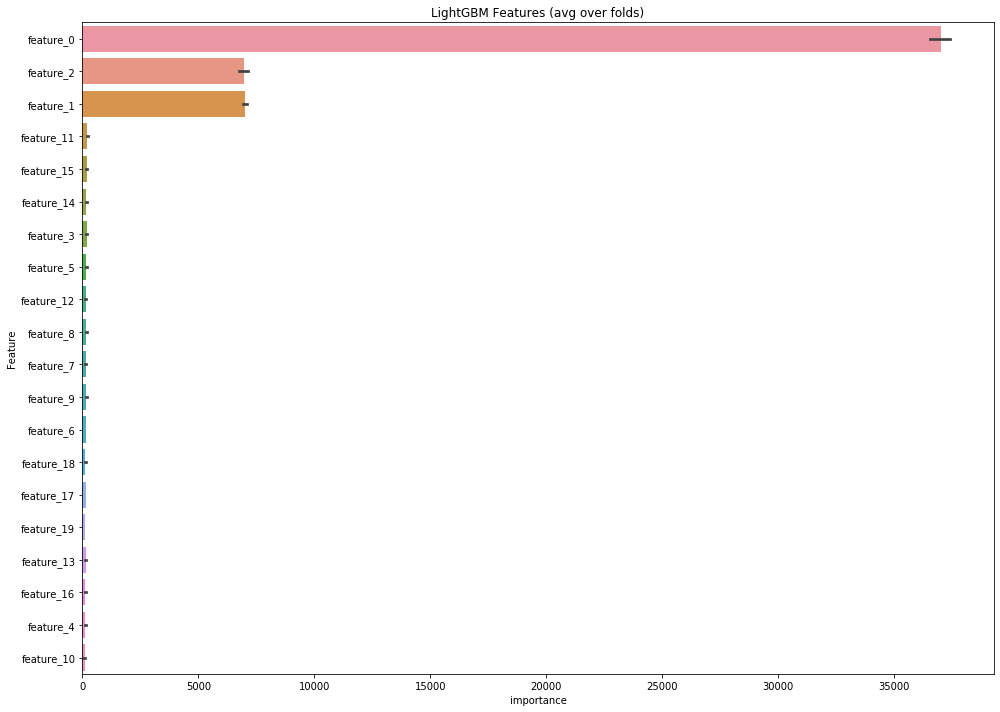

In [136]:
plt.figure(figsize=(14,10))
sns.barplot(x="importance",
            y="Feature",
            data=feature_importance_df_10.sort_values(by="importance",
                                           ascending=False))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()

In [137]:
param["feature_fraction"] = 0.5

feature_importance_df_05 = pd.DataFrame()

for seed in range(10):
    param["feature_fraction_seed"] = seed
    
    for fold, (idx_tr, idx_te) in enumerate(kf.split(df)):
    
        trn_data = lgb.Dataset(df.iloc[idx_tr][cols], label=df.iloc[idx_tr]["target"])
        val_data = lgb.Dataset(df.iloc[idx_te][cols], label=df.iloc[idx_te]["target"])

        num_round = 10000
        clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=-1, early_stopping_rounds = 100)

        fold_importance_df = pd.DataFrame()
        fold_importance_df["Feature"] = cols
        fold_importance_df["importance"] = clf.feature_importance(importance_type = "gain")
        fold_importance_df["seed"] = seed
        fold_importance_df["fold"] = fold + 1
        feature_importance_df_05 = pd.concat([feature_importance_df_05, fold_importance_df], axis=0)

Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[6]	training's auc: 0.984472	valid_1's auc: 0.592527
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1]	training's auc: 0.967045	valid_1's auc: 0.529154
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[170]	training's auc: 1	valid_1's auc: 0.992117
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[7]	training's auc: 0.980701	valid_1's auc: 0.641533
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[332]	training's auc: 1	valid_1's auc: 0.555967
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[11]	training's auc: 0.994643	valid_1's auc: 0.48749
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[257]	trainin

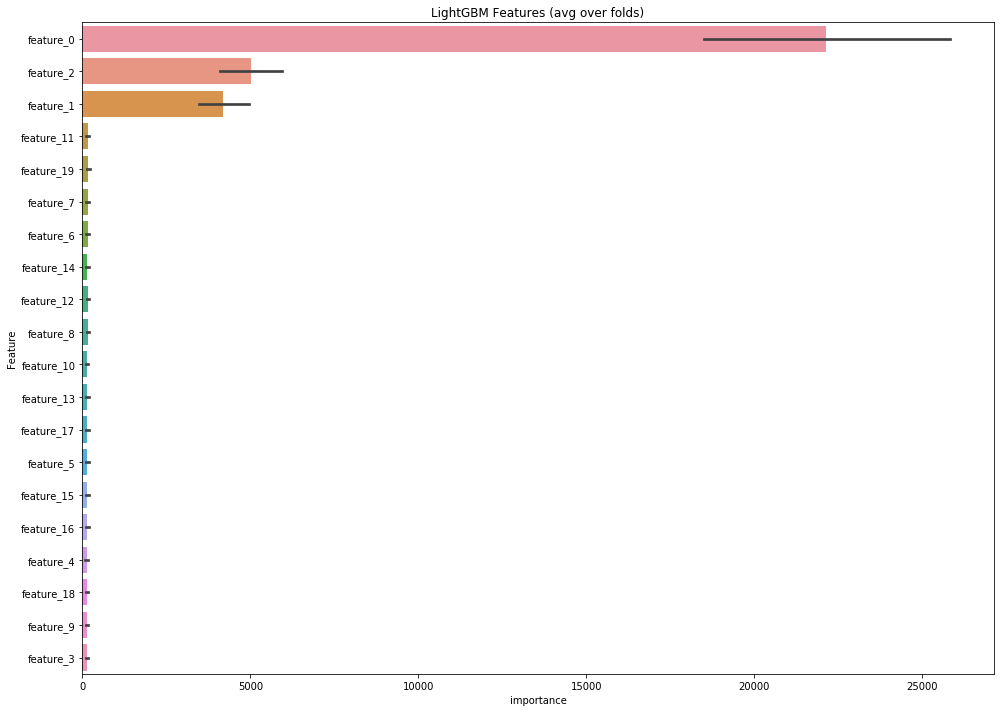

In [138]:
plt.figure(figsize=(14,10))
sns.barplot(x="importance",
            y="Feature",
            data=feature_importance_df_05.sort_values(by="importance",
                                           ascending=False))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()

In [139]:
param["feature_fraction"] = 0.1

feature_importance_df_01 = pd.DataFrame()

for seed in range(10):
    param["feature_fraction_seed"] = seed
    
    for fold, (idx_tr, idx_te) in enumerate(kf.split(df)):
    
        trn_data = lgb.Dataset(df.iloc[idx_tr][cols], label=df.iloc[idx_tr]["target"])
        val_data = lgb.Dataset(df.iloc[idx_te][cols], label=df.iloc[idx_te]["target"])

        num_round = 10000
        clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=-1, early_stopping_rounds = 100)

        fold_importance_df = pd.DataFrame()
        fold_importance_df["Feature"] = cols
        fold_importance_df["importance"] = clf.feature_importance(importance_type = "gain")
        fold_importance_df["seed"] = seed
        fold_importance_df["fold"] = fold + 1
        feature_importance_df_01 = pd.concat([feature_importance_df_01, fold_importance_df], axis=0)

Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1]	training's auc: 0.565737	valid_1's auc: 0.543191
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[298]	training's auc: 0.999687	valid_1's auc: 0.473473
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[598]	training's auc: 1	valid_1's auc: 0.974419
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1]	training's auc: 0.546587	valid_1's auc: 0.580411
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[5]	training's auc: 0.959631	valid_1's auc: 0.532291
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[1]	training's auc: 0.556173	valid_1's auc: 0.652846
Training until validation scores don't improve for 100 rounds
Early stopping, best iteration is:
[106]	

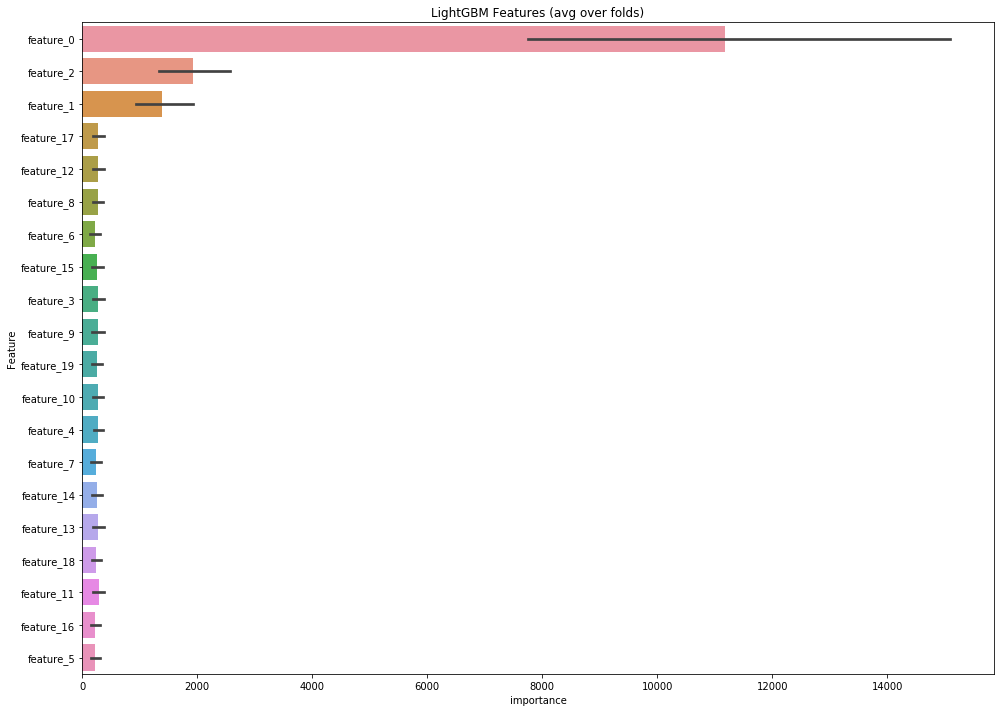

In [140]:
plt.figure(figsize=(14,10))
sns.barplot(x="importance",
            y="Feature",
            data=feature_importance_df_01.sort_values(by="importance",
                                           ascending=False))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()

In [141]:
feature_importance_df_10["fraction"] = "fraction_1.0"
feature_importance_df_05["fraction"] = "fraction_0.5"
feature_importance_df_01["fraction"] = "fraction_0.1"

In [142]:
df_frac = pd.concat([feature_importance_df_10, feature_importance_df_05, feature_importance_df_01], axis = 0).reset_index()

In [143]:
df_frac.sort_values(by = "fraction", ascending = False).head()

,index,Feature,importance,seed,fold,fraction
0,0,feature_0,35530.611,0,1,fraction_1.0
672,12,feature_12,273.319,6,4,fraction_1.0
659,19,feature_19,101.727,6,3,fraction_1.0
660,0,feature_0,37976.653,6,4,fraction_1.0
661,1,feature_1,6862.772,6,4,fraction_1.0


In [144]:
df_frac["importance"] = df_frac["importance"].astype(float)

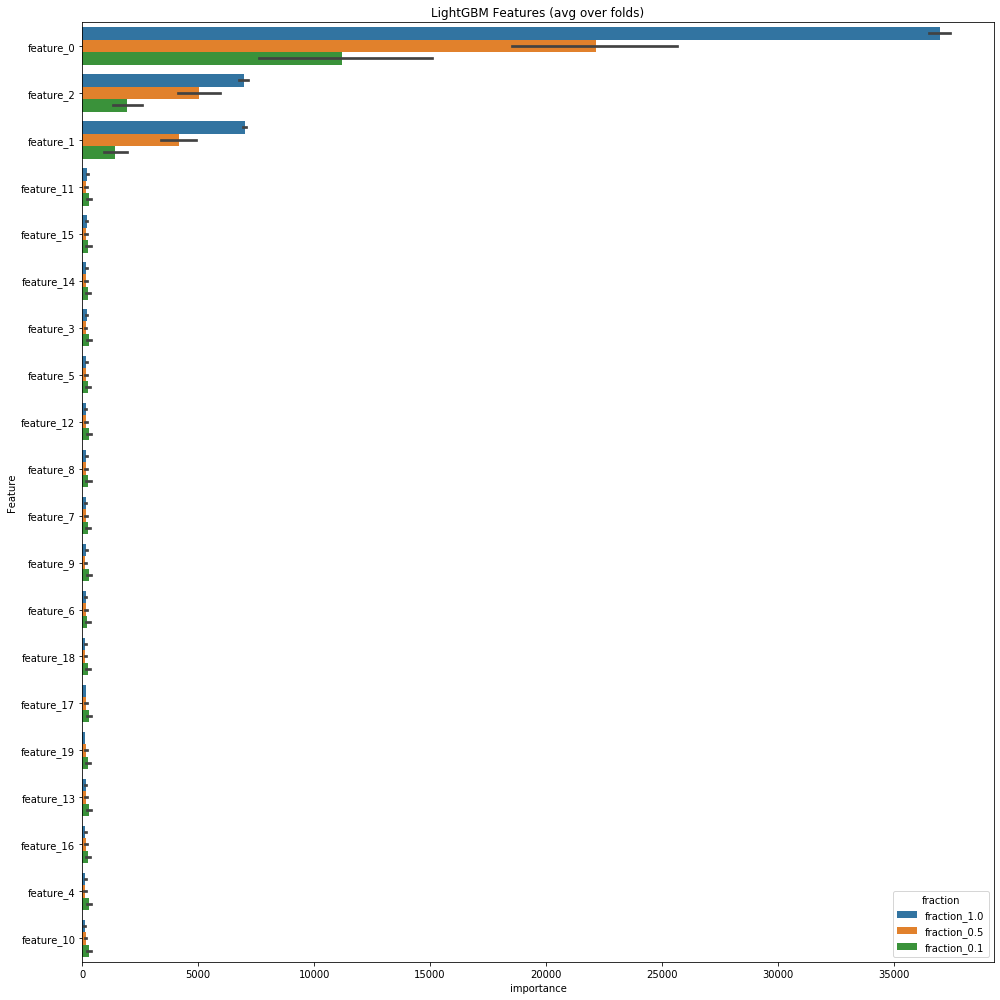

In [154]:
plt.figure(figsize=(14,14))
sns.barplot(x="importance",
            y="Feature",
            hue = "fraction",
            data=df_frac.sort_values(by=["fraction", "importance"],
                                           ascending=[False, False]))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()

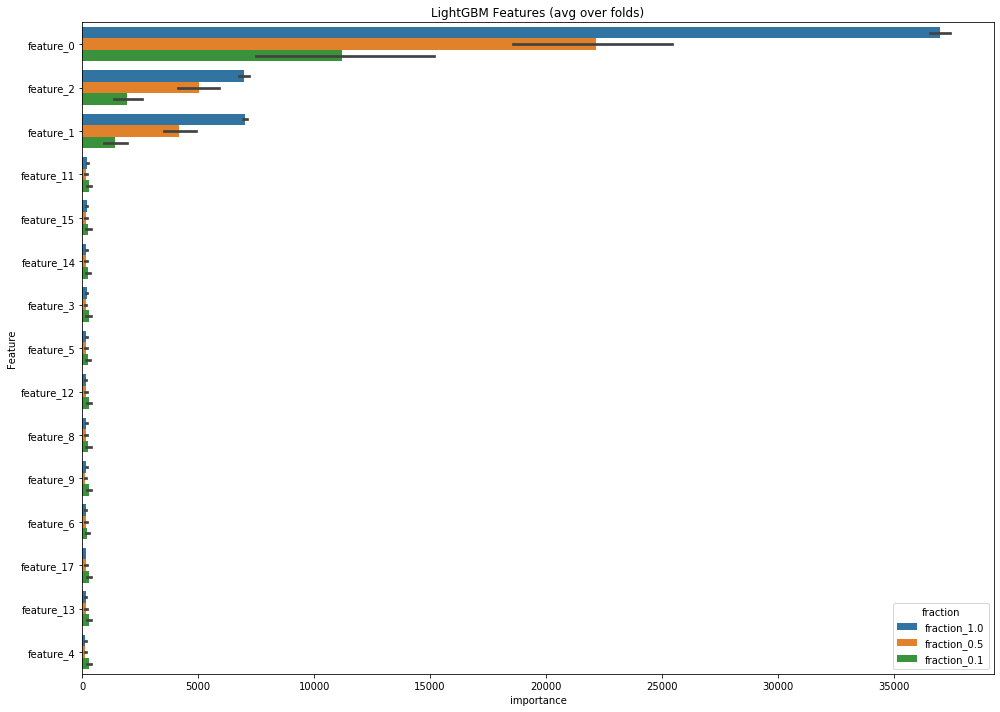

In [155]:
features_high = df_frac.groupby(["Feature"])["importance"].mean().sort_values(ascending = False).head(15).index.tolist()

plt.figure(figsize=(14,10))
sns.barplot(x="importance",
            y="Feature",
            hue = "fraction",
            data=df_frac[df_frac["Feature"].isin(features_high)].sort_values(by=["fraction", "importance"],
                                           ascending=[False,False]))
plt.title('LightGBM Features (avg over folds)')
plt.tight_layout()

In [156]:
features_zero = df_frac.groupby(["fraction","Feature"])["importance"].mean().reset_index()
features_zero = features_zero[features_zero["importance"] == 0]["Feature"].unique().tolist()
df_frac[df_frac["Feature"].isin(features_zero)].groupby(["Feature", "fraction"])["importance"].mean().reset_index()

,Feature,fraction,importance


In [157]:
df_frac = df_frac[["Feature","importance","seed","fold","fraction"]]

In [158]:
df_frac["importance"] = df_frac["importance"].astype(float)

In [159]:
df_frac.head()

,Feature,importance,seed,fold,fraction
0,feature_0,35530.611,0,1,fraction_1.0
1,feature_1,6834.270,0,1,fraction_1.0
2,feature_2,8014.891,0,1,fraction_1.0
3,feature_3,141.373,0,1,fraction_1.0
4,feature_4,48.450,0,1,fraction_1.0


In [160]:
df_mean = df_frac.groupby(["Feature","fraction"])["importance"].mean().reset_index()

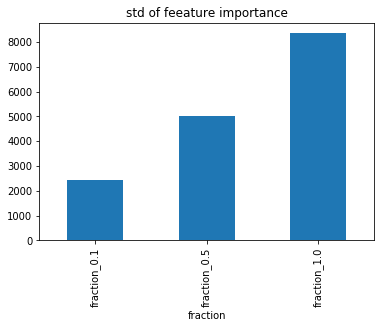

In [161]:
df_mean.groupby(["fraction"])["importance"].std().plot(kind = "bar", title = "std of feeature importance");

In [95]:
df_frac.to_csv("../input/df_frac_synthe.csv", index = False)

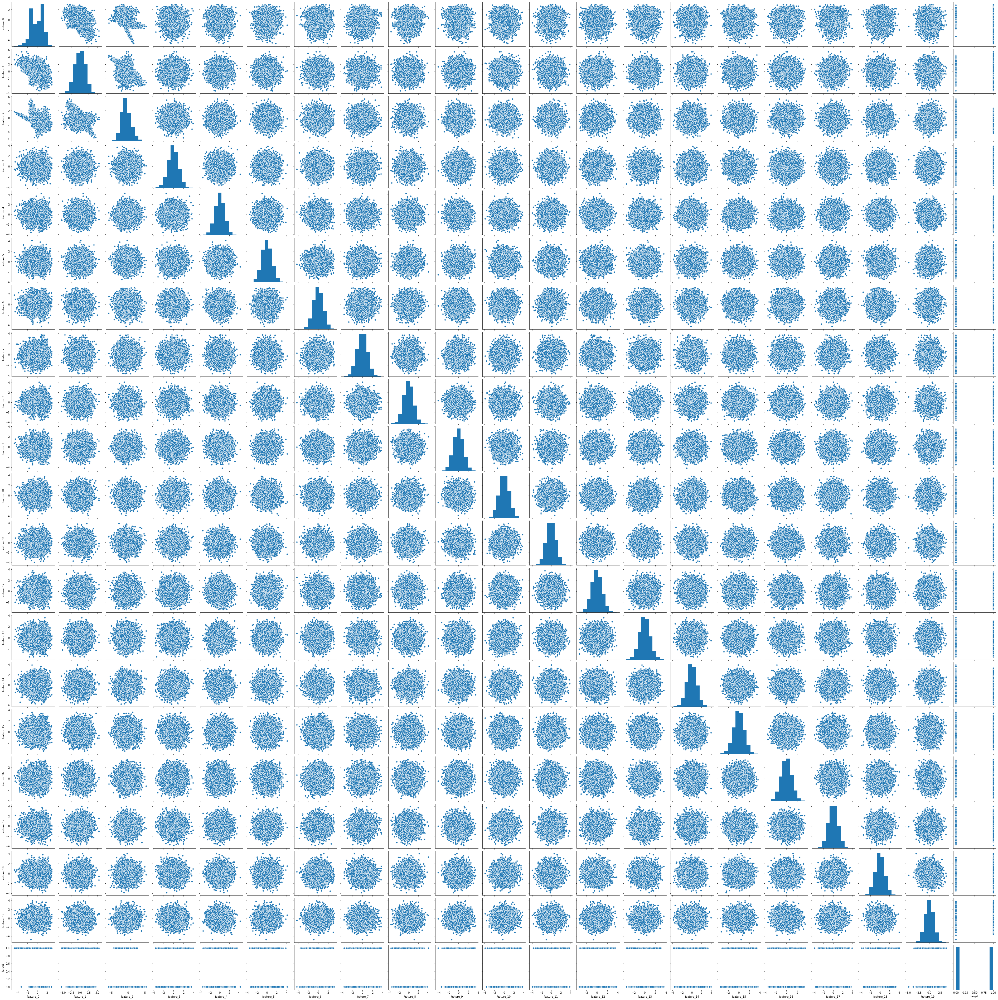

In [98]:
sns.pairplot(df);